# Part 1

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
% matplotlib inline

In [2]:
import urllib2  
header = []
data = urllib2.urlopen('https://gist.githubusercontent.com/jeff-boykin/b5c536467c30d66ab97cd1f5c9a3497d/raw/5233c792af49c9b78f20c35d5cd729e1307a7df7/field_names.txt') 
for line in data: 
    header.append(line.rstrip('\n'))
#this reads in the headers as a list and removes makes sure there's no next line character

In [3]:
header
#read in okay!

['ID',
 'diagnosis',
 'radius_mean',
 'radius_sd_error',
 'radius_worst',
 'texture_mean',
 'texture_sd_error',
 'texture_worst',
 'perimeter_mean',
 'perimeter_sd_error',
 'perimeter_worst',
 'area_mean',
 'area_sd_error',
 'area_worst',
 'smoothness_mean',
 'smoothness_sd_error',
 'smoothness_worst',
 'compactness_mean',
 'compactness_sd_error',
 'compactness_worst',
 'concavity_mean',
 'concavity_sd_error',
 'concavity_worst',
 'concave_points_mean',
 'concave_points_sd_error',
 'concave_points_worst',
 'symmetry_mean',
 'symmetry_sd_error',
 'symmetry_worst',
 'fractal_dimension_mean',
 'fractal_dimension_sd_error',
 'fractal_dimension_worst']

In [4]:
df = pd.read_csv('https://gist.githubusercontent.com/jeff-boykin/b5c536467c30d66ab97cd1f5c9a3497d/raw/5233c792af49c9b78f20c35d5cd729e1307a7df7/breast-cancer.csv', names=header)
#now reading in the actual data with the list of headers as column names

In [5]:
#that worked
df.head()

,ID,diagnosis,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,...,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
#running an EDA function to take a look at null values, what the types in different series are, and what the shape of the dataframe is
#also looking to see how many unique values there are in each column
def eda(dataframe):
    print "missing values \n", dataframe.isnull().sum()
    print "dataframe types \n", dataframe.dtypes
    print "dataframe shape \n", dataframe.shape
    for item in dataframe:
        print item
        print df[item].nunique()

eda(df)
#no missing values
#most things are floats which is cool

missing values 
ID                            0
diagnosis                     0
radius_mean                   0
radius_sd_error               0
radius_worst                  0
texture_mean                  0
texture_sd_error              0
texture_worst                 0
perimeter_mean                0
perimeter_sd_error            0
perimeter_worst               0
area_mean                     0
area_sd_error                 0
area_worst                    0
smoothness_mean               0
smoothness_sd_error           0
smoothness_worst              0
compactness_mean              0
compactness_sd_error          0
compactness_worst             0
concavity_mean                0
concavity_sd_error            0
concavity_worst               0
concave_points_mean           0
concave_points_sd_error       0
concave_points_worst          0
symmetry_mean                 0
symmetry_sd_error             0
symmetry_worst                0
fractal_dimension_mean        0
fractal_dimension_sd_err

In [38]:
sns.pairplot(df)
#i definitely didn't try to pairplot 31 columns. 
#on the other hand, there's definitely a tonne of collinearity going on here

In [7]:
df.describe()
#probably best to scale the data to make sure the different variables have equal weight

,ID,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,perimeter_worst,...,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [8]:
df.columns
#reference guide to what columns are available to work with

Index([u'ID', u'diagnosis', u'radius_mean', u'radius_sd_error',
       u'radius_worst', u'texture_mean', u'texture_sd_error', u'texture_worst',
       u'perimeter_mean', u'perimeter_sd_error', u'perimeter_worst',
       u'area_mean', u'area_sd_error', u'area_worst', u'smoothness_mean',
       u'smoothness_sd_error', u'smoothness_worst', u'compactness_mean',
       u'compactness_sd_error', u'compactness_worst', u'concavity_mean',
       u'concavity_sd_error', u'concavity_worst', u'concave_points_mean',
       u'concave_points_sd_error', u'concave_points_worst', u'symmetry_mean',
       u'symmetry_sd_error', u'symmetry_worst', u'fractal_dimension_mean',
       u'fractal_dimension_sd_error', u'fractal_dimension_worst'],
      dtype='object')

In [9]:
#how many observations are there of benign and malignant diagnoses?
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [10]:
print df.groupby('diagnosis').smoothness_mean.mean()
df.groupby('diagnosis').compactness_mean.mean()
#marked difference of means between smoothness of benign and malignant tumours as opposed to compactiness, where there's a much smaller difference. 

diagnosis
B    2.000321
M    4.323929
Name: smoothness_mean, dtype: float64


diagnosis
B    0.021438
M    0.032281
Name: compactness_mean, dtype: float64

In [11]:
#change diagnosis to a binary variable to make it easier to work with/plot
df.diagnosis = [1 if x == 'M' else 0 for x in df.diagnosis ]

In [12]:
#function for generating a random sample with replacement

def bootstrap(df, n):
    return df.sample(n, replace=True)

bootstrap(df, 40)

,ID,diagnosis,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,...,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
497,914580,0,12.47,17.31,80.45,480.1,0.08928,0.07630,0.036090,0.023690,...,14.060,24.34,92.82,607.3,0.12760,0.25060,0.20280,0.10530,0.3035,0.07661
235,88249602,0,14.03,21.25,89.79,603.4,0.09070,0.06945,0.014620,0.018960,...,15.330,30.28,98.27,715.5,0.12870,0.15130,0.06231,0.07963,0.2226,0.07617
67,859465,0,11.31,19.04,71.80,394.1,0.08139,0.04701,0.037090,0.022300,...,12.330,23.84,78.00,466.7,0.12900,0.09148,0.14440,0.06961,0.2400,0.06641
444,9110127,1,18.03,16.85,117.50,990.0,0.08947,0.12320,0.109000,0.062540,...,20.380,22.02,133.30,1292.0,0.12630,0.26660,0.42900,0.15350,0.2842,0.08225
104,862989,0,10.49,19.29,67.41,336.1,0.09989,0.08578,0.029950,0.012010,...,11.540,23.31,74.22,402.8,0.12190,0.14860,0.07987,0.03203,0.2826,0.07552
12,846226,1,19.17,24.80,132.40,1123.0,0.09740,0.24580,0.206500,0.111800,...,20.960,29.94,151.70,1332.0,0.10370,0.39030,0.36390,0.17670,0.3176,0.10230
136,868223,0,11.71,16.67,74.72,423.6,0.10510,0.06095,0.035920,0.026000,...,13.330,25.48,86.16,546.7,0.12710,0.10280,0.10460,0.06968,0.1712,0.07343
409,905501,0,12.27,17.92,78.41,466.1,0.08685,0.06526,0.032110,0.026530,...,14.100,28.88,89.00,610.2,0.12400,0.17950,0.13770,0.09532,0.3455,0.06896
25,852631,1,17.14,16.40,116.00,912.7,0.11860,0.22760,0.222900,0.140100,...,22.250,21.40,152.40,1461.0,0.15450,0.39490,0.38530,0.25500,0.4066,0.10590
453,911201,0,14.53,13.98,93.86,644.2,0.10990,0.09242,0.068950,0.064950,...,15.800,16.93,103.10,749.9,0.13470,0.14780,0.13730,0.10690,0.2606,0.07810


In [13]:
#import standard scaler to scale data
from sklearn.preprocessing import StandardScaler
SS = StandardScaler()

In [14]:
#declare X variables here
X = df.drop(['ID', 'diagnosis'], axis=1)

In [15]:
X.head()

,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,perimeter_worst,area_mean,...,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [16]:
#declare y variable while we're at it
y = df.diagnosis

In [113]:
#create a new dataframe with scaled X variables
X = pd.DataFrame(SS.fit_transform(X), columns=X.columns)

In [114]:
#and establish names of different variables as 
names = X.columns

In [115]:
#run through and figure out what the best features are
from sklearn.feature_selection import SelectKBest, f_classif, RFE
X_new = SelectKBest(f_classif, k=3).fit(X, y)
print sorted(zip(map(lambda x: round(x, 4), X_new.scores_), names))
#looks like perimeter_sd_error, concave_points_sd_error, and fractal_dimension_mean are the most predictive features. 

[(0.0241, 'concavity_mean'), (0.0391, 'area_worst'), (0.0935, 'area_mean'), (2.558, 'smoothness_worst'), (3.4683, 'concavity_sd_error'), (39.0145, 'compactness_sd_error'), (53.2473, 'compactness_mean'), (66.444, 'fractal_dimension_worst'), (69.5274, 'perimeter_worst'), (83.6511, 'texture_sd_error'), (113.2628, 'compactness_worst'), (118.0961, 'radius_sd_error'), (118.8602, 'fractal_dimension_sd_error'), (122.4729, 'symmetry_mean'), (149.5969, 'concave_points_mean'), (243.6516, 'smoothness_sd_error'), (253.8974, 'smoothness_mean'), (268.8403, 'area_sd_error'), (304.3411, 'symmetry_sd_error'), (313.2331, 'texture_worst'), (436.6919, 'symmetry_worst'), (533.7931, 'perimeter_mean'), (573.0607, 'texture_mean'), (646.981, 'radius_mean'), (661.6002, 'concave_points_worst'), (697.2353, 'radius_worst'), (860.7817, 'concavity_worst'), (861.676, 'perimeter_sd_error'), (897.9442, 'concave_points_sd_error'), (964.3854, 'fractal_dimension_mean')]


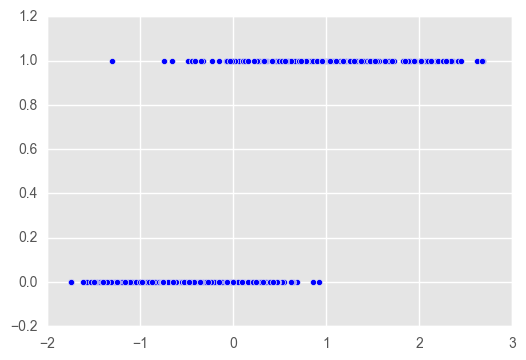

In [25]:
#plotting out the relationship between each of the selected variables and the target
plt.scatter(X.fractal_dimension_mean, y)
#the relationship between fractal dimension mean and whether or not a tumour is malignant or benign follows an S-shaped curve really nicely.
#so, cells that have a higher mean fractal dimension are more likely to be malignant

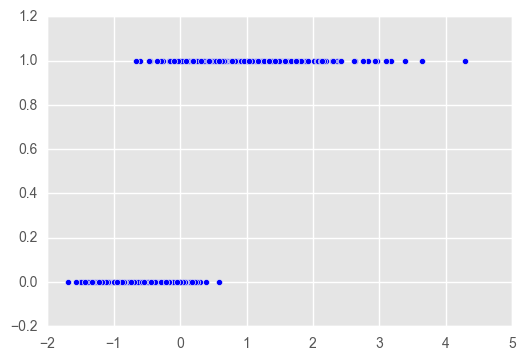

In [113]:
plt.scatter(X.concave_points_sd_error, y)
#also a pretty clear division. Again, higher standard deviation error on concave points on the contour indicate a malignant tumour

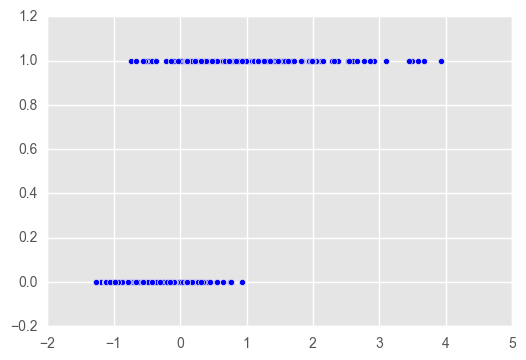

In [26]:
plt.scatter(X.perimeter_sd_error, y)
#less clear division on this one, with a lot of overlap on values between -1 and 0. Higher standard deviation error on the perimeter indicates a malignant tumour

In [27]:
#okay, let's run this with all features and see if X_best are still the best
X_best = df[['concave_points_sd_error', 'fractal_dimension_mean', 'perimeter_sd_error']]

In [28]:
from sklearn.cross_validation import train_test_split
from sklearn.cross_validation import cross_val_score, StratifiedKFold, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, classification_report, roc_curve, auc

/Users/rb/anaconda/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [29]:
lr = LogisticRegression(solver='liblinear')
#using liblinear as this is quite a small dataset
#liblinear FAQs go into the solver in really great detail: https://www.csie.ntu.edu.tw/~cjlin/liblinear/FAQ.html#l1_regularized_classification
#logistic regression applies an L2 (ridge) penalty as a default, which works well with the liblinear solver and helps prevent overfitting by penalizing the effect of larger values

In [30]:
rf = RandomForestClassifier(max_depth=5, max_features=3)
#setting max_depth as 5 and max_features at 3 to reduce overfitting. this will force the RF classifier to reduce the complexity of the model

In [116]:
#establish labels for the monster function below
names = ["present", "not present", "predicted present", "predicted not present"]

In [134]:
#set up function for running model. 
#a few notes on this
#the model fits on a training sample and tests on a held out 33% of data
#the test sample has a similar distribution to the train sample (that's why it's stratified on the y)
#i've engineered the thresholds for the confusion matrix so it's overly cautious. if there's a 30% chance of the tumour being malignant, this will classify it as being malignant

def evaluate_model(estimator, X, y, names):
    X_train, X_test, Y_train, Y_test = train_test_split(X, y, stratify=y, test_size=0.33, random_state=7)
    model = estimator.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    print model.score(X_test, Y_test)
    Y_pp = pd.DataFrame(model.predict_proba(X_test), columns=['class_0_pp','class_1_pp'])
    Y_pp['pred_class_thresh'] = [1 if x >= 0.30 else 0 for x in Y_pp.class_1_pp.values]
    X_test_df = pd.DataFrame(X_test)
    conmat = np.array(confusion_matrix(Y_test, Y_pp.pred_class_thresh, labels=[1,0]))
    confusion = pd.DataFrame(conmat, index=[names[0:2]],
                         columns=[names[2:]]) 
    print confusion
    print(classification_report(Y_test, Y_pp.pred_class_thresh))
    try:
        print sorted(zip(map(lambda x: round(x, 4), model.feature_importances_), X.columns))
    except:
        rfe = RFE(estimator, n_features_to_select=3)
        rfe.fit(X_train, Y_train)
        print sorted(zip(map(lambda x: round(x, 4), rfe.ranking_), X.columns))

    return "cross val score is", cross_val_score(model, X_train, Y_train, cv=5).mean(), cross_val_score(model, X_train, Y_train, cv=5).std()
    
    


evaluate_model(rf, X, y, names)

0.93085106383
             predicted present  predicted not present
present                     67                      3
not present                 12                    106
             precision    recall  f1-score   support

          0       0.97      0.90      0.93       118
          1       0.85      0.96      0.90        70

avg / total       0.93      0.92      0.92       188

[(0.001, 'area_mean'), (0.0013, 'concavity_sd_error'), (0.0026, 'texture_worst'), (0.0028, 'compactness_mean'), (0.003, 'texture_sd_error'), (0.0034, 'fractal_dimension_worst'), (0.0038, 'smoothness_mean'), (0.0041, 'compactness_worst'), (0.006, 'smoothness_worst'), (0.0061, 'perimeter_worst'), (0.0066, 'concavity_mean'), (0.01, 'symmetry_mean'), (0.0105, 'area_worst'), (0.0122, 'concave_points_mean'), (0.014, 'radius_sd_error'), (0.0152, 'perimeter_mean'), (0.0181, 'concave_points_worst'), (0.0235, 'compactness_sd_error'), (0.0246, 'symmetry_sd_error'), (0.0277, 'fractal_dimension_mean'), (0.0426, 'fr

('cross val score is', 0.95820141262246528, 0.015199048441659818)

In [136]:
evaluate_model(lr, X, y, names)

0.984042553191
             predicted present  predicted not present
present                     68                      2
not present                  3                    115
             precision    recall  f1-score   support

          0       0.98      0.97      0.98       118
          1       0.96      0.97      0.96        70

avg / total       0.97      0.97      0.97       188

[(1.0, 'concave_points_worst'), (1.0, 'concavity_worst'), (1.0, 'fractal_dimension_mean'), (2.0, 'concave_points_sd_error'), (3.0, 'perimeter_sd_error'), (4.0, 'concave_points_mean'), (5.0, 'area_sd_error'), (6.0, 'symmetry_mean'), (7.0, 'symmetry_worst'), (8.0, 'smoothness_sd_error'), (9.0, 'compactness_mean'), (10.0, 'radius_sd_error'), (11.0, 'perimeter_mean'), (12.0, 'texture_mean'), (13.0, 'fractal_dimension_sd_error'), (14.0, 'radius_mean'), (15.0, 'smoothness_mean'), (16.0, 'radius_worst'), (17.0, 'area_worst'), (18.0, 'area_mean'), (19.0, 'fractal_dimension_worst'), (20.0, 'texture_worst'), (2

('cross val score is', 0.97371656413761676, 0.014446743131060093)

## Results

#### Random Forest
Advantages: don't need linear features, work well in high dimensional spaces,
Disadvantages: take longer to train, CAN overfit, difficult to visualise


#### Logistic Regression
Advantages: convenient because it gives you probability scores making it easy to understand and easy to explain, don't need to worry too much about feature correlation (which is great, because a LOT of these features are correlated)
Disadvantages: requires that each data point be independent of all other data points, vulnerable to overconfidence

#### Performance of the models:
* Logistic regression did better than random forest at predicting malignant tumours. 
* Cross-val score: the mean score for LR was 0.97 with a standard deviation of 0.014 which shows that all 5 cross-validated models had very similar accuracy scores. The random forest had a mean score of 0.95 and a std of 0.02.
* Looking at the confusion matrix: logistic regression does a lot better--it only misclassifies 5 cases (2 where cancer was present and the model said it wasn't, and 3 where it wasn't and the model said it was). Random forest incorrectly predicts 13. 
* Classification report: just looking at the f-1 score (which provides the harmonic mean between the precision and recall rates), logistic regression does way better.

#### Most predictive variables:
* Not quite the same as the features selected by SelectKBest
* Random Forest: the most informative features according to random forest are area standard deviation error, the standard deviation error of perimeter, and worst concavity. Fractal dimension isn't one of the more informative features.
* Logistic regression: the features that contribute the most to predictive y (using recursive feature elimination) are: worst concave points, worst concavity, and fractal dimension mean.

## Explanation

#### Technical Audiences

While both the random forest and logistic regression did really well in classifying malignant and benign tumours, there is still room for improvement/fine-tuning. It would be beneficial to tune the parameters on the logistic regression model using grid search. The amount of collinearity between variables should also be reduced. It would be good to only use ONE variable per feature (only use mean concavity, for example) to reduce multicollinearity. Could also use PCA to correct for this.
The high logistic regression accuracy score probably requires a bit more investigation. Having a larger dataset to test on would be really beneficial in making sure the logistic regression model is not overconfident in its predictions. 

#### Non-Technical Audiences

I used two models to try to classify malignant and benign tumours. The model that worked better was logistic regression, which predicted the probability of a tumour being malignant or benign based on a number of variables. I separated the data into two sets, one to train the model on and one to test it on. When running on the test set, if the model predicted a 30% or more likelihood of a tumour being malignant, it classified that tumour as cancerous. Logistic regression allows for parameters to be tweaked to make sure you can be as precise in your predictions as you need to be.

The model accurately predicted malignant vs. benign tumours (roughly) 97% of the time.

The features that it found to be the most predictive were worst concave points, worst concavity, and fractal dimension mean. Concavity refers to the severity of concave portions of the contour of the tumour,  concave points refer to the number of concave portions of the contour, and fractal dimensions refer to the "space filling" capacity of a pattern that tells how a fractal scales differently from the space it is embedded in. 



# Part 2

#### student-sample-1.py
Nicely commented steps! A few things to note: it'll be a lot easier to call your target variable 'y' to avoid confusion. X generally refers to our variables, and y denotes our target. Remember to specifically reference the library you're calling (linear_model for LinearRegression). Also, ALWAYS double-check your variable names so you know what you're calling (data vs. d!). 
Good job identifying that both train-test-split and cross val are great ways to avoid overfitting. To use cross val more effectively, you should increase the number of folds. Pay careful attention to the documentation before you built anything: http://scikit-learn.org/stable/modules/cross_validation.html. Here's a good example on how to use train-test-split, as well: http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html. Remember, when in doubt: read the docs!


#### student-sample-2.py
Great job, especially on using cross-validation to evaluate your model's performance. One thing to note: you may want to drop a column when you're creating dummy variables to avoid collinearity. The pandas documentation tells you how. Next time, try minimizing the number of lines of code you're writing. You could fit the last two lines into one line, for example.